### Data

In [ ]:
import tensorflow as tf
import os
import pathlib
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display
from tqdm import tqdm

In [ ]:
# Notebook can load all data at once
# dataset_names = ["post_earthquake", "death_valley", "laytonville", "mt_rainier", "san_gabriel"]

dataset_names = ["san_gabriel"]

In [ ]:
PATH = pathlib.Path('/dataset')

In [ ]:
# mount google drive with data
import numpy as np
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
def normalize_dataset(dataset, minn, maxx):
    if minn < 0:
        dataset = dataset + abs(minn)
        for i in range(len(dataset)):
            dataset[i] = dataset[i] / (maxx + abs(minn)) * 255.0
    else:
        for i in range(len(dataset)):
            dataset[i] = (dataset[i] - minn)/(maxx - minn) * 255.0
    return dataset

In [ ]:
!mkdir /dataset

In [ ]:
dataset_names = ["death_valley"]

def check_min_max(grid, current_min, current_max):
    minn = grid.min()
    if minn < current_min:
        current_min = minn
    maxx = grid.max()
    if maxx > current_max:
        current_max = maxx
    return current_min, current_max


def create_dataset(dataset_names, batch_size = 150, printt = False):
    minn = 9999
    maxx = -9999
    train_length = 0
    test_length = 0
    validation_length = 0
    for dataset_name in dataset_names:
        train_grids = np.load('/content/drive/MyDrive/inzynierka/data_shuffled/' + dataset_name + '/train_grids.npy', mmap_mode = 'r')
        minn, maxx = check_min_max(train_grids, minn, maxx)
        if printt:
            print('train', dataset_name, minn, maxx)
        validation_grids = np.load('/content/drive/MyDrive/inzynierka/data_shuffled/' + dataset_name + '/validation_grids.npy', mmap_mode = 'r')
        minn, maxx = check_min_max(validation_grids, minn, maxx)
        if printt:
            print('val', dataset_name, minn, maxx)
        test_grids = np.load('/content/drive/MyDrive/inzynierka/data_shuffled/' + dataset_name + '/test_grids.npy', mmap_mode = 'r')
        minn, maxx = check_min_max(test_grids, minn, maxx)
        if printt:
            print('test', dataset_name, minn, maxx)

        train_length += len(train_grids)
        test_length += len(test_grids)
        validation_length += len(validation_grids)

    train_file = np.memmap('/dataset/train.npy', dtype=np.float32, mode='w+', shape=(train_length,256,512,3))
    test_file = np.memmap('/dataset/test.npy', dtype=np.float32, mode='w+', shape=(test_length,256,512,3))
    validation_file = np.memmap('/dataset/validation.npy', dtype=np.float32, mode='w+', shape=(validation_length,256,512,3))
        
    for folder in ('train', 'test', 'validation'):
        nr = 0
        for dataset_name in dataset_names:
            grids = np.load('/content/drive/MyDrive/inzynierka/data_shuffled/' + dataset_name + '/' + folder + '_grids.npy', mmap_mode = 'r')
            images = np.load('/content/drive/MyDrive/inzynierka/data_shuffled/' + dataset_name + '/' + folder + '_images.npy', mmap_mode = 'r')
            for batch_id in tqdm(range(0, len(grids), batch_size)):
                batch_grids = np.array(grids[batch_id : batch_id + batch_size])
                batch_images = np.array(images[batch_id : batch_id + batch_size])

                batch_grids = np.stack((batch_grids,)*3, axis=-1)
                batch_grids = normalize_dataset(batch_grids, minn, maxx)

                batch_concatanated = np.concatenate((batch_images, batch_grids), axis=2)
                for i in range(len(batch_concatanated)):
                    if folder == 'train':
                        train_file[nr] = batch_concatanated[i]
                    elif folder == 'test':
                        test_file[nr] = batch_concatanated[i]
                    elif folder == 'validation':
                        validation_file[nr] = batch_concatanated[i]
                    nr+=1
    return train_file, test_file, validation_file
    
train_file, test_file, validation_file = create_dataset(dataset_names, printt = True)

train death_valley -83.16474925157331 575.9197284862569
val death_valley -83.16474925157331 575.9197284862569
test death_valley -83.16474925157331 575.9197284862569


100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


In [ ]:
train_file.shape, test_file.shape, validation_file.shape

((546, 256, 512, 3), (69, 256, 512, 3), (68, 256, 512, 3))

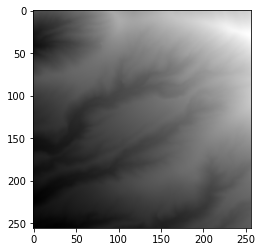

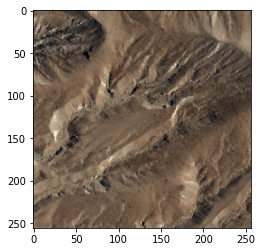

In [ ]:
i = 50
plt.figure()
mx = np.array(train_file[i][:, 256:, :]).max()
mn = np.array(train_file[i][:, 256:, :]).min()
plt.imshow((train_file[i][:, 256:, :] - mn) / (mx-mn))

plt.figure()
mx = np.array(train_file[i][:, :256, :]).max()
mn = np.array(train_file[i][:, :256, :]).min()
plt.imshow((train_file[i][:, :256, :] - mn) / (mx-mn))

In [ ]:
def load(image):
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, 256:, :]
  real_image = image[:, :256, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [ ]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  input_image, real_image = resize(input_image, real_image, 286, 286)
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)
  return input_image, real_image

In [ ]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)
  return input_image, real_image

In [ ]:
examples = len(train_file)
example_shape = (256, 512, 3)
huge_data_shape = (examples, *example_shape)
huge_data_dtype = np.float32

def train_data_generator():
    return iter(train_file)

train_dataset = tf.data.Dataset.from_generator(
    generator=train_data_generator,
    output_types=huge_data_dtype,
    output_shapes=example_shape,
)

train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
examples = len(test_file)
example_shape = (256, 512, 3)
huge_data_shape = (examples, *example_shape)
huge_data_dtype = np.float32

def test_data_generator():
    return iter(test_file)

test_dataset = tf.data.Dataset.from_generator(
    generator=test_data_generator,
    output_types=huge_data_dtype,
    output_shapes=example_shape,
)

test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
examples = len(validation_file)
example_shape = (256, 512, 3)
huge_data_shape = (examples, *example_shape)
huge_data_dtype = np.float32

def test_data_generator():
    return iter(validation_file)

validation_dataset = tf.data.Dataset.from_generator(
    generator=test_data_generator,
    output_types=huge_data_dtype,
    output_shapes=example_shape,
)

validation_dataset = validation_dataset.map(load_image_test)
validation_dataset = validation_dataset.batch(BATCH_SIZE)

### Generator

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print(down_result.shape)

(1, 128, 128, 3)


In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),
    downsample(128, 4),
    downsample(256, 4),
    downsample(512, 4),
    downsample(512, 4),
    downsample(512, 4),
    downsample(512, 4),
    downsample(512, 4),
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),
    upsample(512, 4, apply_dropout=True),
    upsample(512, 4, apply_dropout=True),
    upsample(512, 4),
    upsample(256, 4),
    upsample(128, 4),
    upsample(64, 4),
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')

  x = inputs

  # Downsampling
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

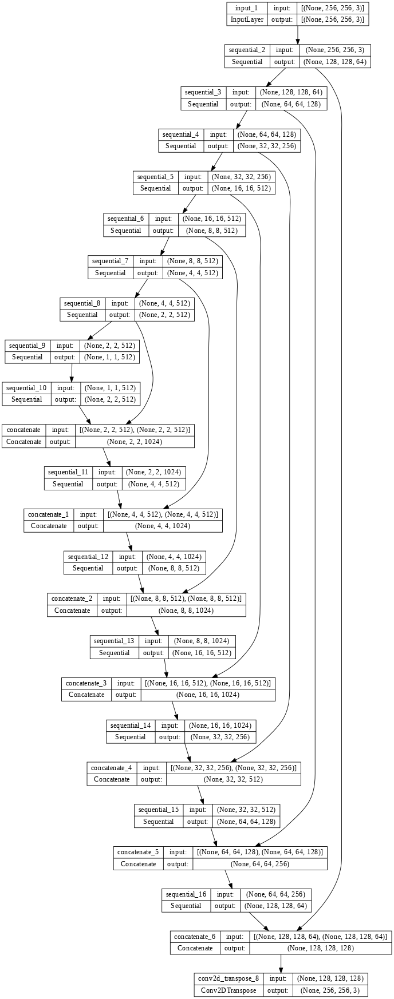

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

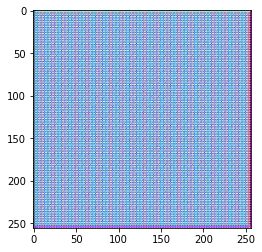

In [ ]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

### Discriminator

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])

  down1 = downsample(64, 4, False)(x)
  down2 = downsample(128, 4)(down1)
  down3 = downsample(256, 4)(down2)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) 
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

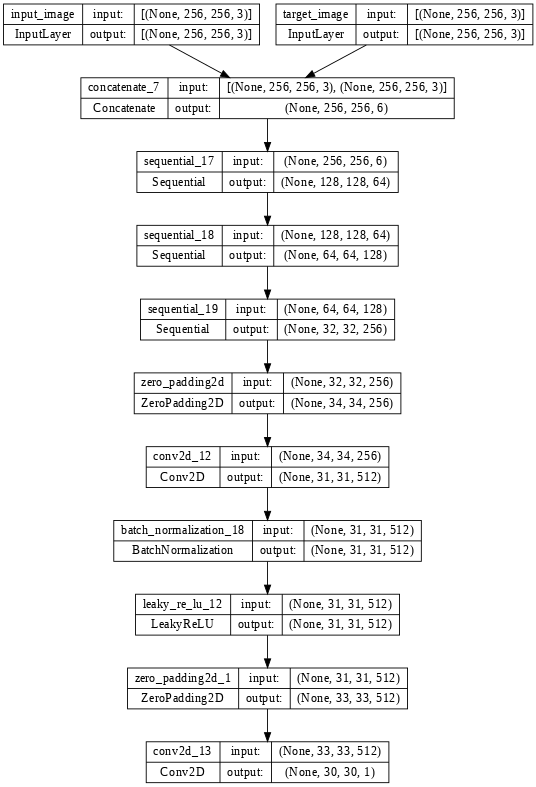

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

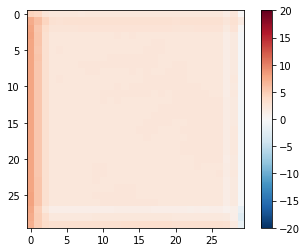

In [ ]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

### Train


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  minn = np.array(test_input[0]).min()
  maxx = np.array(test_input[0]).max()
  display_list = [(test_input[0] - minn) / (maxx - minn), tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

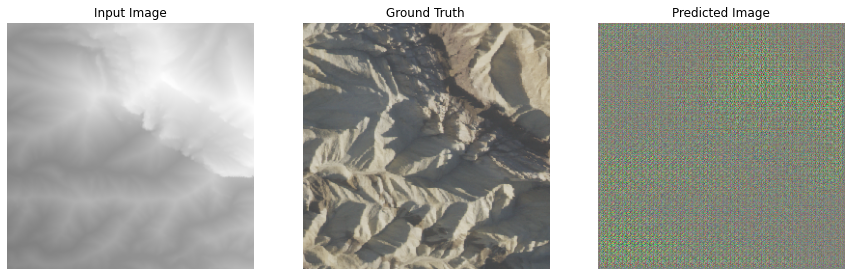

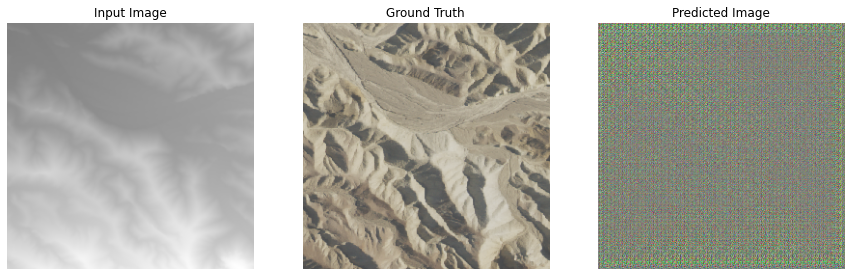

In [ ]:
for example_input, example_target in test_dataset.take(2):
  generate_images(generator, example_input, example_target)

In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
@tf.function
def test_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  with summary_writer.as_default():
    tf.summary.scalar('val_gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('val_gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('val_gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('val_disc_loss', disc_loss, step=step//1000)

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

      # validation
      for val_step, (val_input_image, val_target) in test_ds.repeat().take(1000).enumerate():
          test_step(val_input_image, val_target, step)
      #

    train_step(input_image, target, step)

    if (step+1) % 10 == 0:
      print('.', end='', flush=True)

    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

Time taken for 1000 steps: 115.95 sec



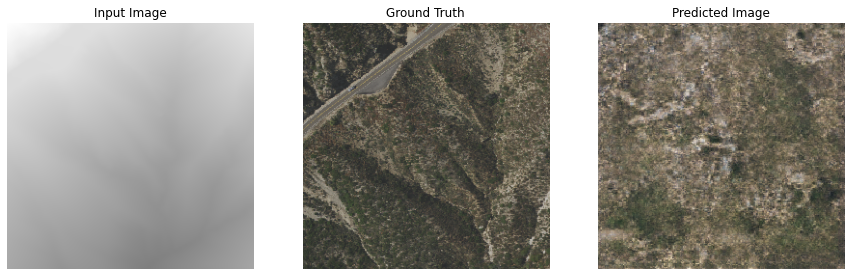

Step: 86k
..........

In [ ]:
# It was run in different configurations for different data, not always with all cells, so its why here we have other data than before and after
fit(train_dataset, validation_dataset, steps=100001)

In [ ]:
!tensorboard dev upload --logdir {log_dir}

2022-12-30 14:47:34.464771: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Upload started and will continue reading any new data as it's added to the logdir.

To stop uploading, press Ctrl-C.

New experiment created. View your TensorBoard at: https://tensorboard.dev/experiment/YoZtWDWoT7K5nOJDw59oyA/

[2022-12-30T14:47:34] Started scanning logdir.
E1230 14:49:58.058513 140713313482624 uploader.py:564] Upload call failed with error <_InactiveRpcError of RPC that terminated with:
	status = StatusCode.RESOURCE_EXHAUSTED
	details = "Rate limit exceeded. Please try again later."
	debug_error_string = "UNKNOWN:Error received from peer ipv4:34.95.66.171:443 {created_time:"2022-12-30T14:49:58.058012764+00:00", grpc_status:8, grpc_message:"Rate limit exceeded. Please try again later."}"
>
E1230 14:52:59.071814 140713313482624 uploader.py:564] Upload call failed with error <_InactiveRpcError of RPC that termin

In [ ]:
display.IFrame(
    src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
    width="100%",
    height="1000px")

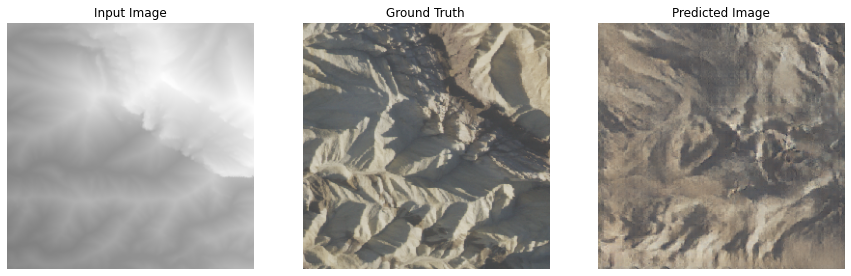

In [ ]:
for inp, tar in test_dataset:
  generate_images(generator, inp, tar)
  break

In [ ]:
generator.compile(optimizer='adam', loss='binary_crossentropy')
generator.save('/content/drive/MyDrive/inzynierka/model.h5')